In [1]:
import sys
import numpy as np
from astropy.io import fits
from aspired import aspired
import plotly.io as pio
pio.renderers.default = 'notebook+jpg'

In [2]:
science_frame = aspired.ImageReduction('examples/lhs6328.list')
science_frame.reduce()
#science_frame.inspect()
#science_frame.savefits(overwrite=True)

standard_frame = aspired.ImageReduction('examples/hiltner102.list')
standard_frame.reduce()
#standard_frame.inspect()

/Users/marcolam/git/ASPIRED/aspired/aspired.py:265: UserWarning:

No bias frames. Bias subtraction is not performed.

/Users/marcolam/git/ASPIRED/aspired/aspired.py:275: UserWarning:

No flat frames. Field-flattening is not performed.



In [3]:
# Example data from SPRAT
# LHS6328 companion WD
science_data = science_frame.fits_data.data

# Example data from SPRAT
# Hiltner102
standard_data = standard_frame.fits_data.data

In [4]:
# Set the spectral and spatial direction
Saxis = 1
Waxis = 0

# spec mask
spec_mask = np.arange(science_frame.fits_data.header['NAXIS1'])
spatial_mask = np.arange(40,science_frame.fits_data.header['NAXIS2'])

# initialise the two aspired.TwoDSpec()
lhs6328 = aspired.TwoDSpec(
    science_data,
    spatial_mask=spatial_mask,
    spec_mask=spec_mask,
    rn=2.34,
    cr=False,
    gain=2.45,
    seeing=1.2
)
hilt102 = aspired.TwoDSpec(
    standard_data,
    spatial_mask=spatial_mask,
    spec_mask=spec_mask,
    rn=2.34,
    cr=False,
    gain=2.45,
    seeing=1.2
)

/Users/marcolam/git/ASPIRED/aspired/aspired.py:394: RuntimeWarning:

invalid value encountered in log10

/Users/marcolam/git/ASPIRED/aspired/aspired.py:395: RuntimeWarning:

invalid value encountered in log10



/Users/marcolam/git/ASPIRED/aspired/aspired.py:770: RuntimeWarning:

invalid value encountered in log10



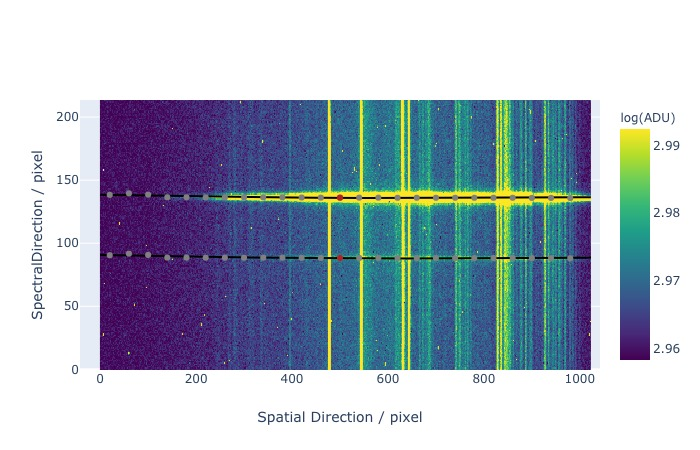

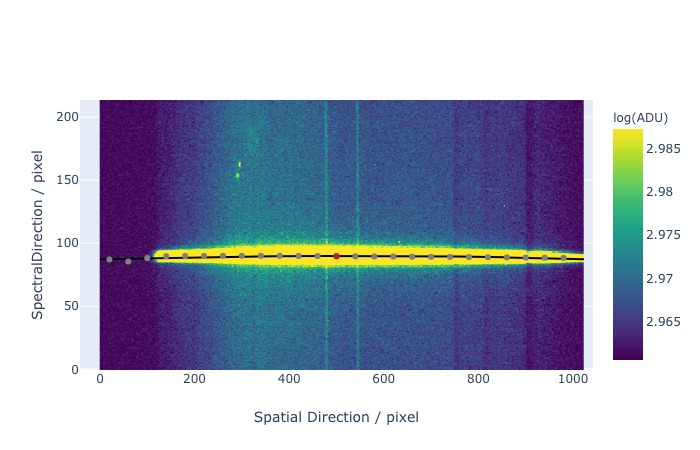

In [5]:
# automatically trace the spectrum
lhs6328.ap_trace(n_spec=3, display=True)
hilt102.ap_trace(n_spec=1, display=True)

/Users/marcolam/git/ASPIRED/aspired/aspired.py:1450: RuntimeWarning:

invalid value encountered in log10

/Users/marcolam/git/ASPIRED/aspired/aspired.py:1451: RuntimeWarning:

invalid value encountered in log10



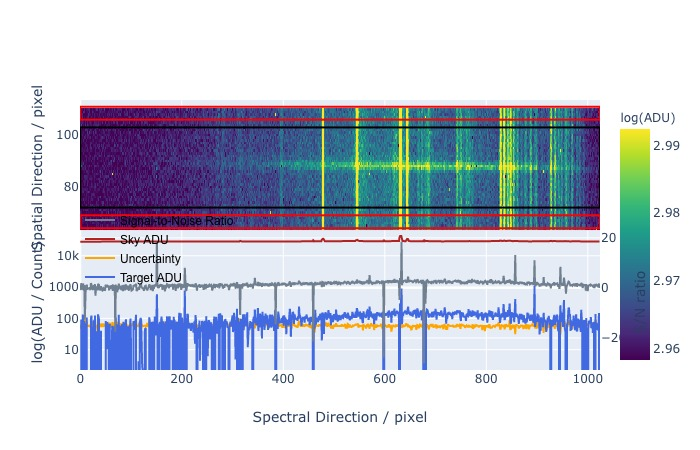

/Users/marcolam/git/ASPIRED/aspired/aspired.py:568: RuntimeWarning:

invalid value encountered in double_scalars

/Users/marcolam/git/ASPIRED/aspired/aspired.py:576: RuntimeWarning:

invalid value encountered in less

/Users/marcolam/git/ASPIRED/aspired/aspired.py:1335: RuntimeWarning:

invalid value encountered in log10



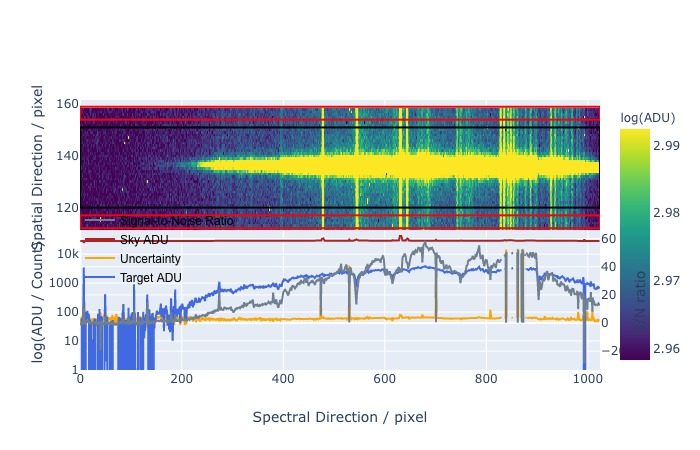

/Users/marcolam/git/ASPIRED/aspired/aspired.py:570: RuntimeWarning:

divide by zero encountered in double_scalars

/Users/marcolam/git/ASPIRED/aspired/aspired.py:573: RuntimeWarning:

invalid value encountered in double_scalars



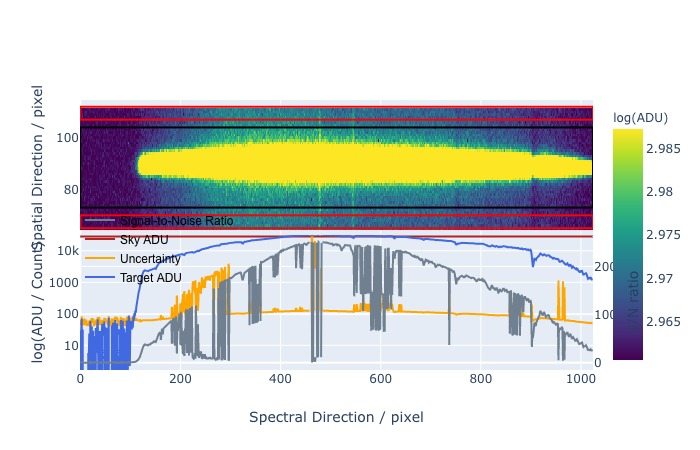

In [6]:
# Optimal extracting spectrum by summing over the aperture along the trace
lhs6328.ap_extract(
    apwidth=15,
    optimal=True,
    display=True,
    renderer='default',
    verbose=False)
hilt102.ap_extract(
    apwidth=15, skysep=3, skywidth=5, skydeg=1,
    optimal=True,
    display=True,
    renderer='default',
    verbose=False)

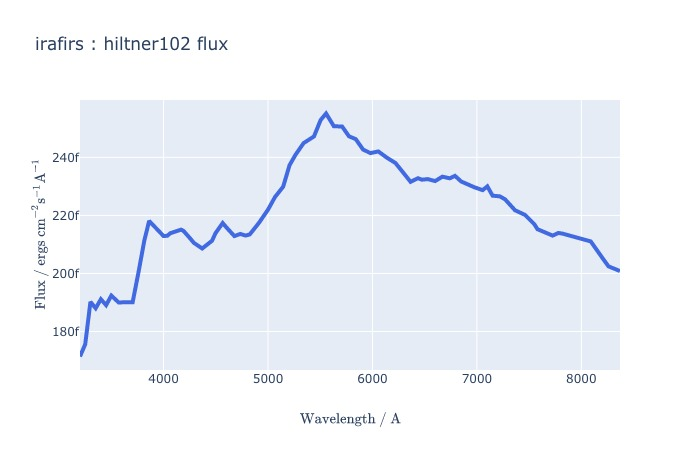

In [7]:
fluxcal = aspired.StandardFlux(
    target='hiltner102',
    group='irafirs',
    cutoff=0.4,
    ftype='flux'
)
fluxcal.load_standard()
fluxcal.inspect_standard(renderer='default')

In [8]:
# Placeholder of wavelength calibration
wavecal = type('', (), {})()
wavecal.pfit_type = 'poly'
wavecal.pfit = [3.17707768e-07, -6.15874242e-04,  5.13807283e+00,  3.22724313e+03]


/usr/local/lib/python3.7/site-packages/spectres/spectral_resampling.py:74: UserWarning:

spectres: Part of the new wavelengths specified is outside the range of the input data, they are filled with zeros.

/Users/marcolam/git/ASPIRED/aspired/aspired.py:1903: RuntimeWarning:

divide by zero encountered in true_divide

/Users/marcolam/git/ASPIRED/aspired/aspired.py:1906: RuntimeWarning:

invalid value encountered in greater



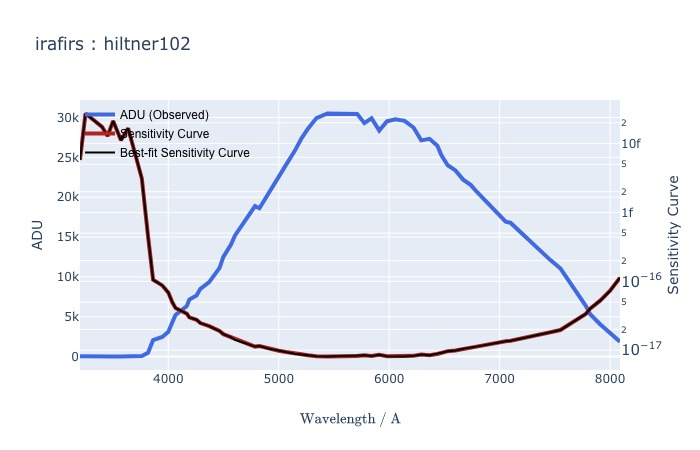

In [9]:
# Get the sensitivity curves
lhs6328_reduced = aspired.OneDSpec(
    lhs6328,
    wavecal,
    standard=hilt102,
    wave_cal_std=wavecal,
    flux_cal=fluxcal
)
lhs6328_reduced.apply_wavelength_calibration('all')
lhs6328_reduced.compute_sencurve(kind='cubic')
lhs6328_reduced.inspect_sencurve(renderer='default')

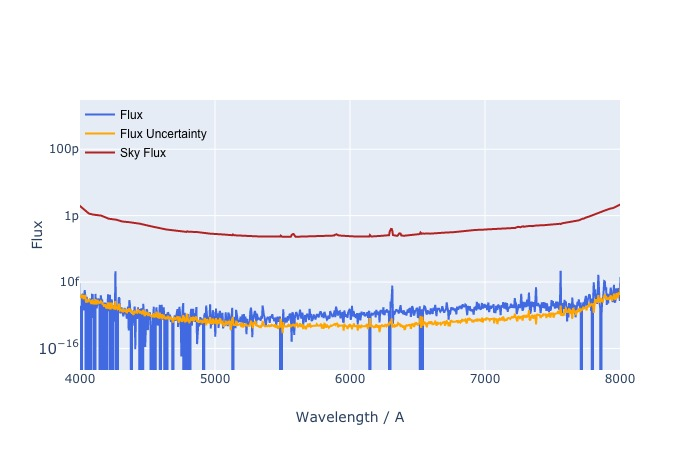

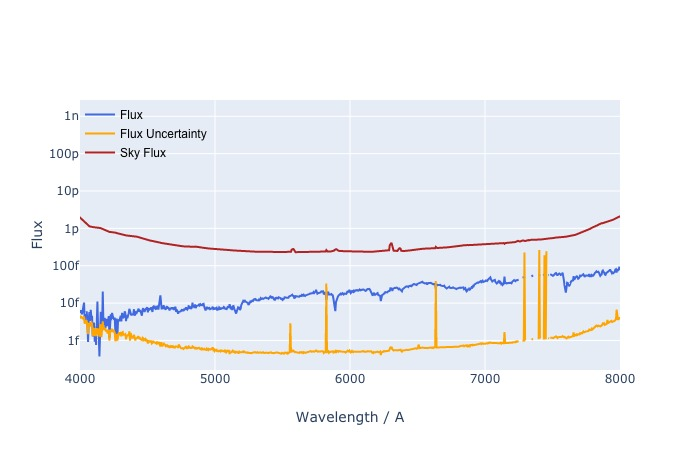

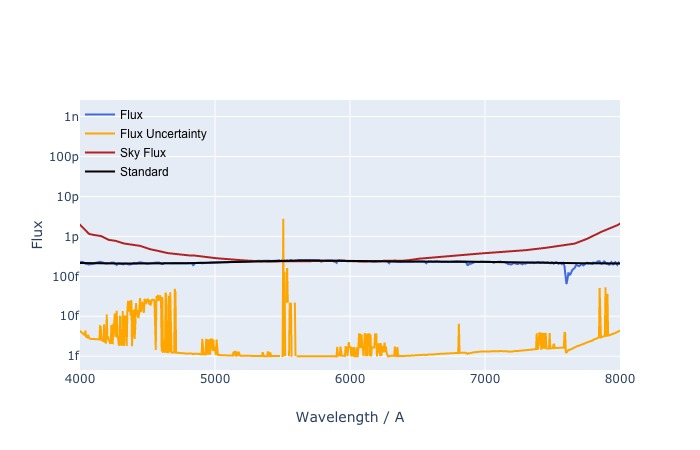

In [10]:
lhs6328_reduced.apply_flux_calibration('all')
lhs6328_reduced.inspect_reduced_spectrum('all', renderer='default')